<a href="https://colab.research.google.com/github/CesarData/Coursera_Capstone_Project/blob/main/sistema_de_evalucion_zonas_delictivas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


#**Sistema de evaluación de zonas delictivas en el Área Metropolitana de Guadalajara**  
### Ciencia de datos aplicada - Curso Capstone  
### IBM Skills Network    
César González Ortiz

## Tabla de contenidos
1. [Introducción](#introduccion)
2. [Datos](#datos)
3. [Metodología](#metodologia)
4. [Análisis](#analisis)
5. [Resultados](#resultados)
6. [Discusión](#discusion)
7. [Conclusión](#conclusion)
8. [Referencias](#referencias)

##**1 Introducción.** <a name="introduccion"></a>

El Área Metropolitana de Guadalajara (AMG), es la segunda área conurbada más grande de México seguida por el Área Metropolitana del Valle de México (AMVM). Está en la zona centro del Estado de Jalisco y se conforma por diez municipios: San Pedro Tlaquepaque, Tonalá, Zapopan, Tlajomulco de Zúñiga, El Salto, Juanacatlán, Ixtlahuacán de los Membrillos, Acatlán de Juárez, Zapotlanejo y la capital Guadalajara. En 2021 (INEGI, 2022a) Jalisco contribuyó con el 7.3% del PIB situándose en cuarto lugar nacional. Ocupó el primer lugar en las actividades primarias con 13.2%, tercer lugar en actividades secundarias con 6.7% y cuarto lugar en actividades terciarias con 7.1%. Además de este desarrollo económico la entidad cuenta con un rico patrimonio histórico, cultural y artístico que la convierte en uno de los lugares más atractivos del país para vivir, visitar o establecer un negocio. Sin embargo, el AMG como las grandes urbes, tiene una incidencia delictiva mayor que también es un factor para considerar en la toma de decisiones.

###**1.1 Planteamiento del problema.**  

El AMG tiene atractivo turístico, económico y cultural, es por ello, que es una de las áreas más pobladas de México y con mayor desarrollo. Cuando deseamos visitarlo, mudarnos o establecer un negocio ahí necesitamos conocer el entorno del punto de interés (*point of interest*, POI como los llama Foursquare). Si vamos sólo de visita quizá será suficiente con saber cuáles son los lugares populares, dónde están las estaciones de bus y tren, o las ubicaciones de hoteles y restaurantes. Si deseamos establecer un negocio debemos conocer los establecimientos cercanos y cuáles representan una competencia para él, si la ubicación será asequible para nuestros clientes y proveedores. Si vamos a mudarnos es necesario saber cuál es la infraestructura cercana, que negocios o entretenimiento existe en la zona, escuelas, hospitales y demás servicios. Todos estos datos los proporciona la API de Foursquare, sin embargo, consideramos que se requiere más información para decidir qué lugar visitar o dónde establecer nuestro negocio dentro del AMG. Es útil conocer la incidencia delictiva de la zona y cómo puede impactar a nuestro negocio. Para ello complementaremos la información proporcionada por la API de Foursquare con un mapeo de los delitos cercanos a los POI con el objetivo de ampliar el panorama y tomar una decisión informada.


###**1.2 Audiencia objetivo.**  

Entre los posibles interesados en este proyecto podemos considerar a los siguientes:  

>•	Empresarios que planean abrir un nuevo negocio o sucursal. El sistema, además de mostrarles la competencia en la zona, les mostrará cuáles son los delitos más comunes para evaluar cómo pueden impactar al giro de su negocio.  
  
>•	Compañías inmobiliarias y de la construcción. Estas empresas podrán evaluar la plusvalía de sus inmuebles a partir de la infraestructura y popularidad de la zona, pero también del impacto negativo de la delincuencia.  

>•	Compañías de Seguridad Privada. Las empresas que ofrecen servicios de vigilancia pueden hacer recomendaciones más acertadas a sus clientes sobre el tipo de servicio (armas, patrullaje, tándem, etc.) y cantidad de guardias en base a la incidencia delictiva circundante en la zona.  

>•	Dependencias gubernamentales de Seguridad Pública. La información proporcionada por el sistema puede ayudar a gestionar el patrullaje de policías en zonas populares y con mayor delincuencia.

##**2 Datos.** <a name="datos"></a>

Para este análisis se tomarán en cuenta los delitos del fuero común, es decir, aquellos que afectan a las personas en lo individual como son la vida, la integridad corporal, la libertad personal, la seguridad sexual, el patrimonio, y la familia. Por su naturaleza son delitos perseguidos al interior del Estado.

###**2.1 Fuentes de datos.**  

1.	Los datos sobre la infraestructura, servicios y negocios serán tomados de la API de Foursquare que es alimentada por 50 millones de usuarios mensuales y cuenta con 13 billones de check-ins de 100 millones de POIs (Gajić, 2022).  

2.	La incidencia delictiva en el Área Metropolitana de Guadalajara será tomada de dos archivos en formato csv donde se han recopilados los datos de delitos registrados en carpetas de investigación de la Fiscalía del Estado de Jalisco. Estos archivos son accesibles desde el sitio web del Instituto de Información Estadística y Geográfica de Jalisco (IIEG).    

>*   El primer archivo se encuentra en el siguiente enlace: [https://iieg.gob.mx/ns/wp-content/uploads/2022/11/Centro_agosto22.csv](https://iieg.gob.mx/ns/wp-content/uploads/2022/11/Centro_agosto22.csv). En este archivo se encuentran los municipios de la zona centro de Jalisco incluyendo los que conforman el AMG a excepción de Acatlán de Juárez. Los registros van desde septiembre de 2017 a agosto de 2022. 

>*   El segundo archivo contiene los municipios de la Región Lagunas y es donde se encuentra Acatlán de Juárez para completar los 10 municipios de la AMG. Se pueden descargar del siguiente enlace: [https://iieg.gob.mx/ns/wp-content/uploads/2023/02/Lagunas_nov23.zip](https://iieg.gob.mx/ns/wp-content/uploads/2023/02/Lagunas_nov23.zip). Podemos observar que el archivo dice que es de noviembre de 2023 lo cual es un error de nomenclatura ya que en la página del IIEG señala que los registros van desde enero de 2017 hasta noviembre de 2022.

###**2.2 Limpieza de datos.**  

Los archivos csv seleccionados contienen los municipios de las regiones Centro y Lagunas del Estado de Jalisco de los cuales sólo tomaremos los que pertenecen al AMG y los guardaremos en un *dataframe* de la librería *Pandas*. El resto de municipios de Jalisco (en total 125) están distribuidos en otras regiones cuyos archivos son accesibles desde la página del IIEG.

Comenzamos por importar la totalidad de librerías utilizadas en el proyecto.

In [292]:
#Importación de librerías.

import requests # librería para manejar las solicitudes
import pandas as pd 
import numpy as np 
import zipfile 
import matplotlib.pyplot as plt 
import folium 
from folium.plugins import HeatMap, MiniMap 
from urllib.request import urlopen 
from geopy.geocoders import Nominatim # módulo para convertir una dirección en valores de latitud y longitud 
from sklearn.preprocessing import LabelEncoder

Se elimina celda que contienen datos sensibles.

Descarga de archivos csv y creación de dataframes pandas. 

In [294]:
url_csv = 'https://iieg.gob.mx/ns/wp-content/uploads/2022/11/Centro_agosto22.csv'
df_iieg_centro = pd.read_csv(url_csv, encoding = 'latin-1')

url_csv = 'https://iieg.gob.mx/ns/wp-content/uploads/2023/02/Lagunas_nov23.zip'
url = urlopen(url_csv)
output = open('zipFile.zip', 'wb')     
output.write(url.read())
output.close()
df_iieg_lagunas = pd.read_csv('zipFile.zip') # Cargar el archivo zip en un dataframe

Utilizamos el método *.info()* para conocer la cantidad de columnas y su tipo de datos. También generamos una visualización de los dataframes con el método *head()*.

In [295]:
print(df_iieg_centro.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 323667 entries, 0 to 323666
Data columns (total 10 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   fecha            323667 non-null  object 
 1   delito           323667 non-null  object 
 2   x                309373 non-null  float64
 3   y                309373 non-null  float64
 4   colonia          323667 non-null  object 
 5   municipio        323667 non-null  object 
 6   clave_mun        323667 non-null  int64  
 7   hora             322187 non-null  object 
 8   bien_afectado    323667 non-null  object 
 9   zona_geografica  323667 non-null  object 
dtypes: float64(2), int64(1), object(7)
memory usage: 24.7+ MB
None


In [296]:
print(df_iieg_lagunas.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5399 entries, 0 to 5398
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   fecha            5399 non-null   object 
 1   delito           5399 non-null   object 
 2   x                5068 non-null   float64
 3   y                5068 non-null   float64
 4   colonia          5399 non-null   object 
 5   municipio        5399 non-null   object 
 6   clave_mun        5399 non-null   int64  
 7   hora             5399 non-null   object 
 8   bien_afectado    5399 non-null   object 
 9   zona_geografica  5399 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 421.9+ KB
None


In [297]:
df_iieg_centro.head()

,fecha,delito,x,y,colonia,municipio,clave_mun,hora,bien_afectado,zona_geografica
0,20/12/2018,Lesiones dolosas,NaN,NaN,NO DISPONIBLE,IXTLAHUACAN DE LOS MEMBRILLOS,44,05:30,La vida y la integridad corporal,AMG
1,20/12/2018,Robo casa habitacion,NaN,NaN,NO DISPONIBLE,TLAJOMULCO DE ZUÑIGA,97,17:45,El patrimonio,AMG
2,07/01/2019,Robo a persona,NaN,NaN,NO DISPONIBLE,EL SALTO,70,05:30,El patrimonio,AMG
3,03/01/2019,Robo casa habitacion,NaN,NaN,NO DISPONIBLE,ZAPOPAN,120,17:45,El patrimonio,AMG
4,28/03/2019,Robo a vehiculos particulares,NaN,NaN,NO DISPONIBLE,GUADALAJARA,39,05:30,El patrimonio,AMG


In [298]:
df_iieg_lagunas.head()

,fecha,delito,x,y,colonia,municipio,clave_mun,hora,bien_afectado,zona_geografica
0,12/01/2017,Robo casa habitacion,NaN,NaN,NO DISPONIBLE,SAN MARTIN HIDALGO,77,17:45,El patrimonio,Interior
1,20/01/2017,Lesiones dolosas,NaN,NaN,NO DISPONIBLE,TAPALPA,86,05:30,La vida y la integridad corporal,Interior
2,19/01/2017,Robo a vehiculos particulares,NaN,NaN,NO DISPONIBLE,SAN MARTIN HIDALGO,77,05:30,El patrimonio,Interior
3,13/01/2017,Lesiones dolosas,NaN,NaN,NO DISPONIBLE,SAN MARTIN HIDALGO,77,05:30,La vida y la integridad corporal,Interior
4,23/01/2017,Violencia familiar,NaN,NaN,NO DISPONIBLE,SAN MARTIN HIDALGO,77,17:45,La familia,Interior


Hacemos un agrupación de ambos dataframes para conocer los municipios que los conforman, su clave, a que zona geográfica pertenecen y el total de delitos en cada uno de ellos.

In [299]:
df_iieg_centro.groupby(['zona_geografica', 'municipio', 'clave_mun']).size().reset_index(name = 'total')


,zona_geografica,municipio,clave_mun,total
0,AMG,EL SALTO,70,10017
1,AMG,GUADALAJARA,39,132772
2,AMG,IXTLAHUACAN DE LOS MEMBRILLOS,44,1447
3,AMG,JUANACATLAN,51,668
4,AMG,SAN PEDRO TLAQUEPAQUE,98,40890
5,AMG,TLAJOMULCO DE ZUÑIGA,97,33440
6,AMG,TONALA,101,30887
7,AMG,ZAPOPAN,120,70834
8,AMG,ZAPOTLANEJO,124,2123
9,Interior,CHIQUILISTLAN,32,31


In [300]:
df_iieg_lagunas.groupby(['zona_geografica', 'municipio', 'clave_mun']).size().reset_index(name = 'total')

,zona_geografica,municipio,clave_mun,total
0,Interior,ACATLAN DE JUAREZ,2,1319
1,Interior,AMACUECA,4,60
2,Interior,ATEMAJAC DE BRIZUELA,10,55
3,Interior,ATOYAC,14,95
4,Interior,COCULA,24,829
5,Interior,SAN MARTIN HIDALGO,77,511
6,Interior,SAYULA,82,748
7,Interior,TAPALPA,86,212
8,Interior,TECHALUTA DE MONTENEGRO,89,72
9,Interior,TEOCUITATLAN DE CORONA,92,138


Ahora vamos a crear un sólo dataframe llamado *df_amg* que contendrá los diez municipios del Área Metropolitana de Guadalajara. Para ello extraemos los nueve municipios que se encuentran en el dataframe *df_iieg_centro* que tienen la categoría *'AMG'* en la columna *zona_geografica*. Acatlán de Juárez se encuentra en el dataframe *df_iieg_lagunas* y como vimos más arriba su clave de municipio es 2 así que esta será la condición para agregarlo a *df_amg*.

In [301]:
df_amg = pd.DataFrame()
df_amg = (df_iieg_centro[(df_iieg_centro['zona_geografica'] == 'AMG')]).copy(deep = True) #Los cambios en la copia no se refrejaran en el original
df_amg.shape

(323078, 10)

In [302]:
df_amg = pd.concat([df_amg, df_iieg_lagunas[(df_iieg_lagunas['clave_mun'] == 2)]])
df_amg.shape

(324397, 10)

Corrobamos que el nuevo dataframe contenga sólo los municipios del AMG y evaluamos la cantidad de datos nulos que contiene en sus columnas.

In [303]:
df_amg.groupby(['zona_geografica', 'municipio', 'clave_mun']).size().reset_index(name = 'total')

,zona_geografica,municipio,clave_mun,total
0,AMG,EL SALTO,70,10017
1,AMG,GUADALAJARA,39,132772
2,AMG,IXTLAHUACAN DE LOS MEMBRILLOS,44,1447
3,AMG,JUANACATLAN,51,668
4,AMG,SAN PEDRO TLAQUEPAQUE,98,40890
5,AMG,TLAJOMULCO DE ZUÑIGA,97,33440
6,AMG,TONALA,101,30887
7,AMG,ZAPOPAN,120,70834
8,AMG,ZAPOTLANEJO,124,2123
9,Interior,ACATLAN DE JUAREZ,2,1319


In [304]:
df_amg.isnull().sum()

fecha                  0
delito                 0
x                  14297
y                  14297
colonia                0
municipio              0
clave_mun              0
hora                1473
bien_afectado          0
zona_geografica        0
dtype: int64

Vemos que existen 14,297 valores nulos en las coordenadas y 1,473 en la columna hora. Debido a que el objetivo principal es el trazado en mapa de incidencias delictivas eliminaremos los registros con coordenadas de valores nulos pero conservaremos los horarios de valores nulos ya que consideramos que no afecta a los objetivos del proyecto. Así pues, haremos un cálculo del porcentaje de los datos que se perderán al eliminar las coordenadas de valores nulos. También vamos a eliminar la columna *zona_geografica* ya que todos los datos pertenecen a la misma categoría que es AMG.

In [305]:
#Porcentaje de datos con coordenadas válidas
100 - (df_amg.isnull().sum()['x'] / df_amg.shape[0] * 100)

95.59274592551719

In [306]:
df_amg.dropna(subset = ['x', 'y'], axis = 0, inplace = True)
df_amg.drop(['zona_geografica'], axis=1, inplace = True)
df_amg.shape

(310100, 9)

Originalmente había 324,397 registros y después de borrar aquellos con coordenadas de valores nulos nos quedamos con 310,100 que representa el 95.59%. Para finalizar el dataframe Utilizamos la función *LabelEncoder()* de la librería *sklearn* para generar una columna con valores numéricos que representan los diferentes delitos para posteriormente generar las capas del mapa. También transformaremos la columna *fecha* de tipo *object* a *datetime* para poder extraer el año en análisis posteriores y evaluamos nuevamente los valores nulos de *df_amg*.

In [307]:
encoder_amg = LabelEncoder()
df_amg['encoder'] = encoder_amg.fit_transform(df_amg['delito'])
df_amg['fecha'] = pd.to_datetime(df_amg['fecha'], dayfirst = True)

In [308]:
df_amg.isnull().sum()

fecha               0
delito              0
x                   0
y                   0
colonia             0
municipio           0
clave_mun           0
hora             1338
bien_afectado       0
encoder             0
dtype: int64

In [309]:
#Porcentaje de datos conservados
df_amg.isnull().sum()['hora'] / df_amg.shape[0] * 100

0.4314737181554337

De los 1,473 valores nulos en la columna *hora* ahora quedan 1,338 lo que indica que había registros que además de tener coordenadas con valores nulos también lo tenian en el horario. Los valores nulos en *hora* representan menos de medio punto porcentual y no serán eliminados por que no afecta su geolocalización ni distorsiona la serie temporal de incidencia delictiva que evaluaremos anualmente y en alguna ocasión lo haremos de manera mensual.

##**3 Metodología.** <a name="metodologia"></a>

El objetivo principal de este proyecto es mostrar lo que Foursquare llama *Point of Interest* o POIs alrededor de una ubicación seleccionada que llamaremos ***sitio*** y también mostrar la incidencia delictiva circundante. El trazado en el mapa está limitado al Área Metropolitana de Guadalajara y la recolección de datos abarca de septiembre de 2017 a agosto de 2022 (sólo Acatlán de Juárez cuenta con registros de enero de 2017 a noviembre de 2022). Los POIs y delitos mostrados alrededor del ***sitio*** tienen un radio de 1,000 metros aunque se puede modificar esta distancia.  

El primer paso fue recolectar los datos y unirlos en un dataframe eliminando aquellos registros que contenían valores nulos en las coordenadas.  

El segundo paso es realizar un análisis exploratorio con gráficas de los datos contenidos en el dataframe *df_amg*. Lo que queremos visualizar es el tipo y cantidad de los delitos, así como su incidencia temporal y geográfica.  

El tercer paso es utilizar la API de Foursquare para extraer los datos de los POIs más populares alrededor del ***sitio***. En la versión 3 de la API las consultas están limitadas a 50 lugares para cuentas Free. Los datos que tomaremos de la consulta son el nombre, categoría y coordenadas de los POIs para trazarlos en el mapa junto con un mapa de calor de la incidencia delictiva de la zona.  

En cuarto lugar, trazaremos los delitos en mapas separados por capas utilizando dos criterios: en uno serán capas por año, desde 2017 a 2022 y en el otro serán capas por tipo de delito.  

El quinto paso es generar gráficas de los delitos circundantes al ***sitio*** para conocer con mayor precisión lo que sucede en ese lugar que nos interesa para visitar, establecer un negocio o vivir en él.  


##**4 Análisis.** <a name="analisis"></a>

Sabemos que *df_amg* contiene la información de diez municipios y que abarca los años desde 2017 hasta 2022. Cada registro tiene 10 columnas de datos: fecha, delito, x (longitud), y (latitud), colonia, municipio, clave del municipio, hora, bien afectado y en encoder que es el valor numérico del delito. Necesitamos saber cuántos tipos de delitos hay y a que categoría pertenecen.

In [310]:
df_amg['bien_afectado'].unique()

array(['El patrimonio', 'La vida y la integridad corporal', 'La familia',
       'La libertad y la seguridad sexual'], dtype=object)

In [311]:
for i, delito in enumerate(encoder_amg.classes_):
    print(str(i) + ' ' + delito )

#df_amg['delito'].unique()

0 Abuso sexual infantil
1 Feminicidio
2 Homicidio doloso
3 Lesiones dolosas
4 Robo a bancos
5 Robo a carga pesada
6 Robo a cuentahabientes
7 Robo a int de vehiculos
8 Robo a negocio
9 Robo a persona
10 Robo a vehiculos particulares
11 Robo casa habitacion
12 Robo de autopartes
13 Robo de motocicleta
14 Violacion
15 Violencia familiar


In [312]:
df_amg.groupby(['bien_afectado', 'delito']).size().reset_index(name = 'total')

,bien_afectado,delito,total
0,El patrimonio,Robo a bancos,103
1,El patrimonio,Robo a carga pesada,1832
2,El patrimonio,Robo a cuentahabientes,2442
3,El patrimonio,Robo a int de vehiculos,16689
4,El patrimonio,Robo a negocio,52773
5,El patrimonio,Robo a persona,54595
6,El patrimonio,Robo a vehiculos particulares,60414
7,El patrimonio,Robo casa habitacion,20092
8,El patrimonio,Robo de autopartes,10202
9,El patrimonio,Robo de motocicleta,11198


De los datos anteriores ahora sabemos que existen 310,100 registros del AMG distribuidos en 16 delitos del fuero común y que conforman cuatro categorias segun el bien afectado:  


1.   El patrimonio:  

>*   Robo a vehiculos particulaes
*   Robo a persona
*   Robo a negocio
*   Robo casa habitacion
*   Robo a int de vehiculos
*   Robo de motocicleta
*   Robo de autopartes
*   Robo a cuentahabientes
*   Robo a carga pesada
*   Robo a bancos


2.   La familia  

>*   Violencia familiar

3.   La libertad y la seguridad sexual

>*   Abuso sexual infantil
*   Violacion

4.   La vida y la integridad corporal  

>*   Lesiones dolosas
*   Homicidio doloso
*   Feminicidio


###**4.1 Gráficas del dataframe.** 

Con esta información ya podemos generar las gráficas de manera ordenada. La primera de ellas es una serie temporal que muestra la totalidad de delitos por mes de cada año. No perdamos de vista que no se cuentan con datos completos de enero a agosto de 2017 ni de septiembre a diciembre de 2022 por lo veremos valores bajos en esos periodos. La segunda gráfica es un diagrama de barras que muestra un desglosado de cada delito cometido en esos años.


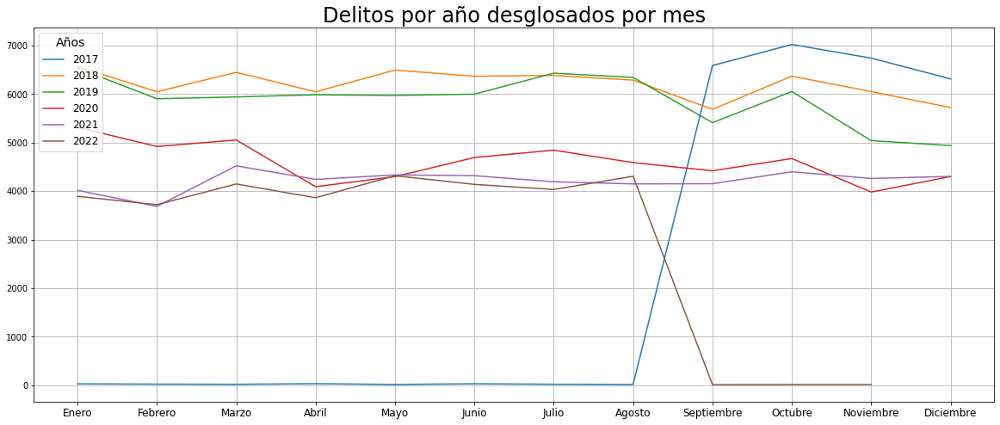

In [313]:
df = df_amg.groupby([df_amg['fecha'].dt.to_period('M')]).size().reset_index(name = 'total') 
df_temp = pd.DataFrame()

df_temp['Año'] = df['fecha'].dt.year
df_temp['Mes'] = df['fecha'].dt.month
df_temp['Total_delitos'] = df['total']
annios = df_temp['Año'].unique()
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']

fig, ax = plt.subplots(figsize = (20, 16))
fig.set_size_inches(20, 8)

[ax.plot(df_temp[df_temp['Año'] == a]['Mes'], df_temp[df_temp['Año'] == a]['Total_delitos'], label = a) for a in annios]

ax.grid(True)
ax.set_title('Delitos por año desglosados por mes', fontsize = 24)
ax.set_xticks(range(1, 13))
ax.set_xticklabels(meses, fontsize = 12)
ax.legend(title = 'Años',  loc = 'upper left', title_fontsize = 14, fontsize = 12)
plt.savefig("del_mun.svg")
plt.show()

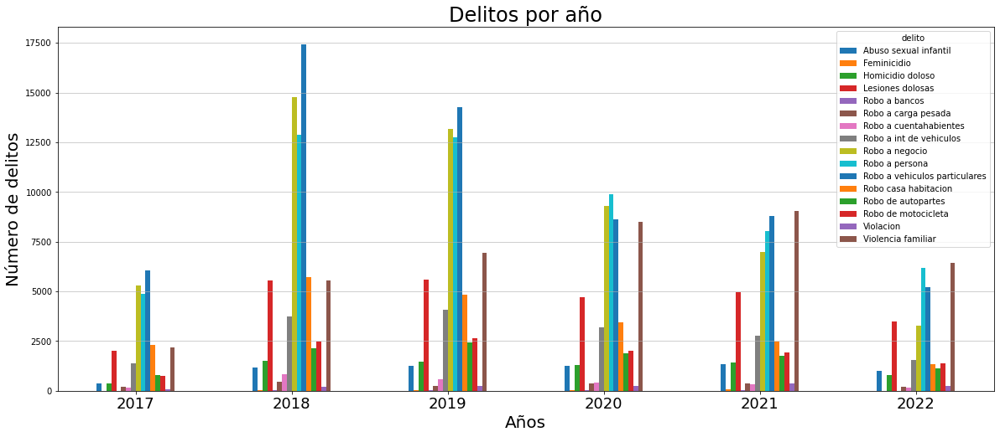

In [314]:
df_aux = df_amg.groupby(['fecha', 'delito']).size().reset_index(name = 'total')
df_aux["año"] = df_aux['fecha'].dt.year
df_aux.sort_values(by = "año", inplace = True)

df_pivot = pd.pivot_table(
    df_aux,
    values="total",
    index="año",
    columns="delito",
    aggfunc=np.sum
)

ax = df_pivot.plot(kind="bar")

fig = ax.get_figure()
fig.set_size_inches(20, 8)
ax.set_title('Delitos por año', fontsize = 24)
ax.set_xlabel('Años', fontsize = 20)
ax.tick_params(axis = 'x', labelsize = 18, rotation = 0)
ax.set_ylabel('Número de delitos', fontsize = 20)
ax.grid(visible = True, axis = 'y', alpha = 0.75)

plt.show()

In [315]:
# función para generar una gradiente entre dos colores con valores hexadecimales o RGB.

def hex_to_RGB(hex_str):
  
    #Pass 16 to the integer function for change of base
    return [int(hex_str[i:i+2], 16) for i in range(1,6,2)]

def get_color_gradient(c1, c2, n):

    assert n > 1
    c1_rgb = np.array(hex_to_RGB(c1))/255
    c2_rgb = np.array(hex_to_RGB(c2))/255
    mix_pcts = [x/(n-1) for x in range(n)]
    rgb_colors = [((1-mix)*c1_rgb + (mix*c2_rgb)) for mix in mix_pcts]
    return ["#" + "".join([format(int(round(val*255)), "02x") for val in item]) for item in rgb_colors]

def get_color_gradient_rgb(c1, c2, n):
  
    assert n > 1
    c1_rgb = np.array(c1)/255
    c2_rgb = np.array(c2)/255
    mix_pcts = [x/(n-1) for x in range(n)]
    rgb_colors = [((1-mix)*c1_rgb + (mix*c2_rgb)) for mix in mix_pcts]
    return rgb_colors 

La siguiente gráfica muestra el acumulado de delitos del AMG en el periodo 2017 - 2022. 

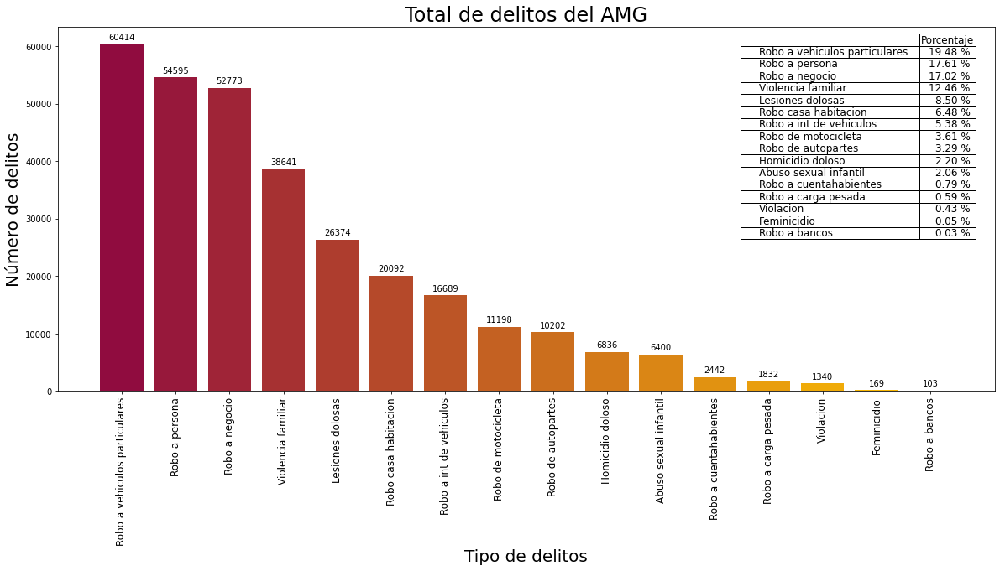

In [316]:
ser_aux = df_amg.groupby("delito").size()
ser_aux.sort_values(ascending = False, inplace = True)

color1 = '#900C3F'
color2 = '#FFC300'
bar_colors = get_color_gradient(color1, color2, 16)

fig, ax = plt.subplots()
fig.set_size_inches(20, 8)

bar_container = ax.bar(ser_aux.index, ser_aux, color = bar_colors)
ax.set_title('Total de delitos del AMG', fontsize =  24)
ax.set_xlabel('Tipo de delitos', fontsize = 20)
ax.tick_params(axis = 'x', labelsize = 12, rotation = 90)
ax.set_ylabel('Número de delitos', fontsize = 20)
ax.bar_label(bar_container, padding = 3) 

cell_val = []
for i in range(0, len(ser_aux)):
    cell_val.append([f'{ser_aux[i] / ser_aux.sum() * 100:1.2f} %'])

table = ax.table(cellText = cell_val, 
         colWidths = [0.05],
         colLabels = ['Porcentaje'],
         rowLabels = ser_aux.index, 
         #rowColours = bar_colors, 
         loc = 'upper right')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2,1.2)
plt.show()

Acumulado de delitos por municipio.

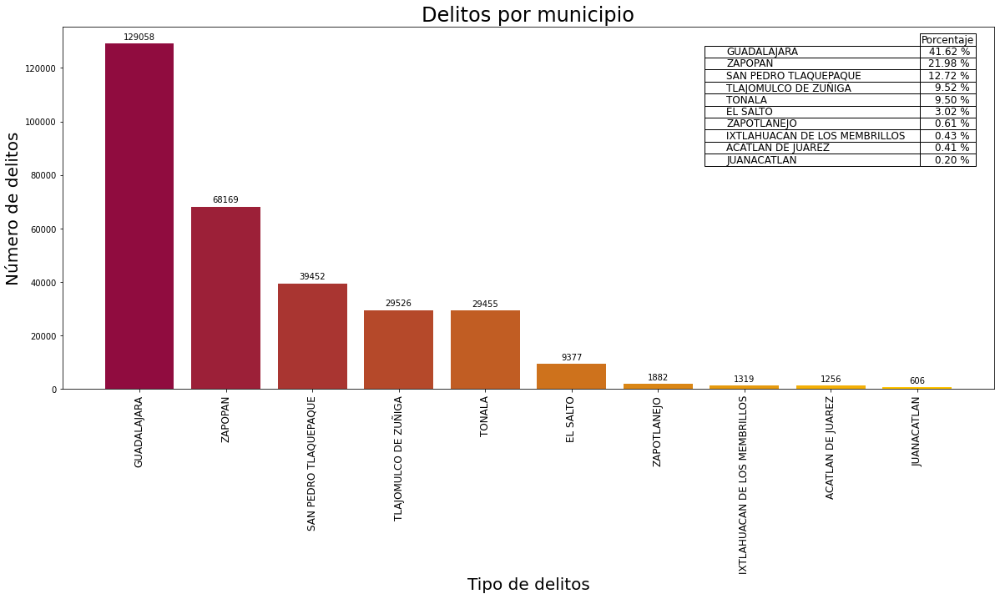

In [317]:
ser_aux = df_amg.groupby('municipio').size()
ser_aux.sort_values(ascending = False, inplace = True)

color1 = '#900C3F'
color2 = '#FFC300'
bar_colors = get_color_gradient(color1, color2, 10)

fig, ax = plt.subplots()
fig.set_size_inches(20, 8)
bar_container = ax.bar(ser_aux.index, ser_aux, color = bar_colors)
ax.set_title('Delitos por municipio', fontsize = 24)
ax.set_xlabel('Tipo de delitos', fontsize = 20)
ax.tick_params(axis = 'x', labelsize = 12, rotation = 90)
ax.set_ylabel('Número de delitos', fontsize = 20)
ax.bar_label(bar_container, padding = 3) 

cell_val = []
for i in range(0, len(ser_aux)):
    cell_val.append([f'{ser_aux[i] / ser_aux.sum() * 100:1.2f} %'])

table = ax.table(cellText = cell_val, 
         colWidths = [0.05],
         colLabels = ['Porcentaje'],
         rowLabels = ser_aux.index, 
         #rowColours = bar_colors, 
         loc = 'upper right')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2,1.2)
plt.show()

Las siguientes gráficas muestran el acumulado desglosado de cada delito por municipio ordenados del de mayor incidencia al menor en el periodo 2017 - 2022.

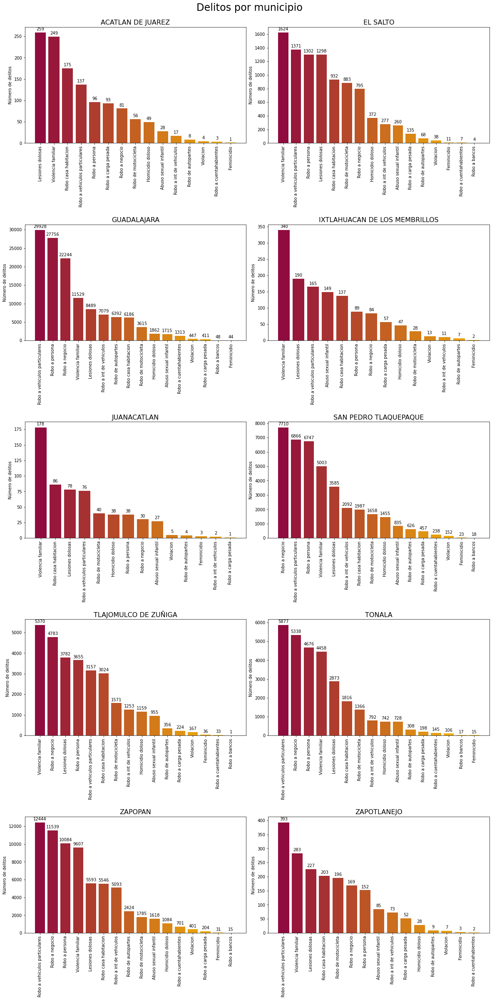

In [318]:
df_mun = pd.DataFrame()
array_mun = np.array([]) # array de municipios

df_mun = df_amg.groupby(['municipio', 'delito']).size().reset_index(name = 'total')
array_mun = df_mun['municipio'].unique()

#fig, axs = plt.subplots(5, 2)
#fig.add_subplot(5, 2, 0)
fig = plt.figure()
fig.suptitle('Delitos por municipio', fontsize = 24, y = 0.9)
fig.set_size_inches(20, 40)
fig.subplots_adjust(hspace = 0.7, wspace = 0.1)

color1 = '#900C3F'
color2 = '#FFC300'
bar_colors = get_color_gradient(color1, color2, 16)


for m in range(0, len(array_mun)):
    df_aux = df_mun[df_mun['municipio'] == array_mun[m]].sort_values('total', ascending = False)
    ax = fig.add_subplot(5, 2, m+1)
    bar_container = ax.bar(df_aux['delito'], df_aux['total'].tolist(), color = bar_colors)
    ax.set_title(array_mun[m], fontsize = 16)
    ax.tick_params(axis = 'x', labelsize = 10, rotation = 90)
    ax.set_ylabel('Número de delitos', fontsize = 10)
    ax.bar_label(bar_container, padding = 3)

#plt.savefig("del_mun.svg")
plt.show()


Las siguientes gráficas muestran las 20 colonias (si las hay) con mayor incidencia delictiva de cada municipio.

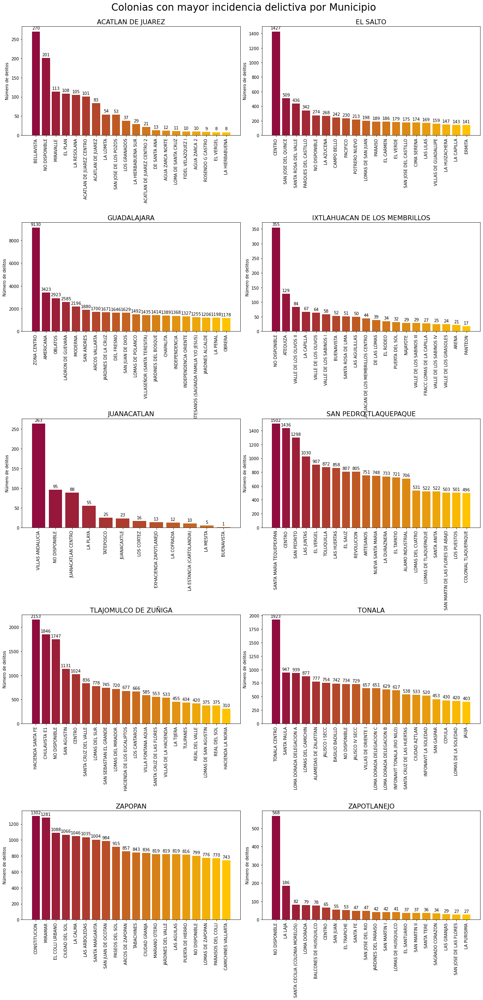

In [319]:
df_mun = pd.DataFrame()
array_mun = np.array([]) # array de municipios
n = 20 #número de colonias

df_mun = df_amg.groupby(['municipio', 'colonia']).size().reset_index(name = 'total')
array_mun = df_mun['municipio'].unique()

fig = plt.figure()
fig.suptitle('Colonias con mayor incidencia delictiva por Municipio', fontsize = 24, y = 0.9)
fig.set_size_inches(20, 40)
fig.subplots_adjust(hspace=0.8, wspace=0.1)

color1 = '#900C3F'
color2 = '#FFC300'
bar_colors = get_color_gradient(color1, color2, n)

for m in range(0, len(array_mun)):
    df_aux = df_mun[df_mun['municipio'] == array_mun[m]].sort_values('total', ascending = False)
    df_aux = df_aux.iloc[:n]
    ax = fig.add_subplot(5, 2, m+1)
    bar_container = ax.bar(df_aux['colonia'], df_aux['total'].tolist(), color = bar_colors)
    ax.set_title(array_mun[m], fontsize = 16)
    ax.tick_params(axis = 'x', labelsize = 10, rotation = 90)
    ax.set_ylabel('Número de delitos', fontsize = 10)
    ax.bar_label(bar_container, padding = 3)

plt.show()

La siguiente gráfica muestra como se distribuye cada delito en los municipios.

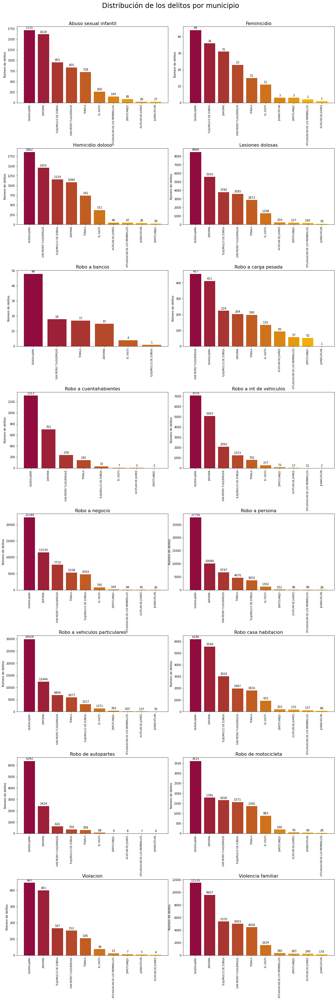

In [320]:
df_del = pd.DataFrame()
array_mun = np.array([]) # array de municipios

df_del = df_amg.groupby(['delito', 'municipio']).size().reset_index(name = 'total')
array_del = df_del['delito'].unique()

fig = plt.figure()
fig.suptitle('Distribución de los delitos por municipio', fontsize = 24, y = 0.9)
fig.set_size_inches(20, 60)
fig.subplots_adjust(hspace = 0.6, wspace=0.1)

color1 = (144, 12, 63)
color2 = (255, 195, 0)
bar_colors = get_color_gradient_rgb(color1, color2, 10)


for d in range(0, len(array_del)):
    df_aux = df_del[df_del['delito'] == array_del[d]].sort_values('total', ascending=False)
    ax = fig.add_subplot(8, 2, d+1)
    bar_container = ax.bar(df_aux['municipio'], df_aux['total'].tolist(), color = bar_colors)
    ax.set_title(array_del[d], fontsize = 16)
    ax.tick_params(axis = 'x', labelsize = 8, rotation = 90)
    ax.set_ylabel('Número de delitos', fontsize = 10)
    ax.bar_label(bar_container, padding = 3)

plt.show()

Ahora exploraremos los horarios más frecuentes de incidencia delictiva.

In [321]:
df_amg['hora'].value_counts()

05:30          75797
17:45          75193
N.D.           16457
12:00           3312
20:00           3254
               ...  
0.846527778        1
0.966666667        1
4.17E-03           1
0.999305556        1
09:56              1
Name: hora, Length: 2109, dtype: int64

Existen 2,109 valores para la columna 'hora' pero no todos son válidos. Vemos que existen horas no disponibles (N.D.) y no consistentes como los valores decimales. Aun así, conservamos estos registros porque, como ya mencionamos, no afecta la geolocalización del delito ni distorsiona la serie temporal de incidencia delictiva que se evalúa anualmente. En la gráfica superior sólo se muestran los 20 horarios con mayor incidencia. Llama la atención que cerca de la mitad de los delitos suceden en sólo dos horarios, 5:30 y 17:45, es por lo que se grafican los delitos desglosados en estos dos horarios. 

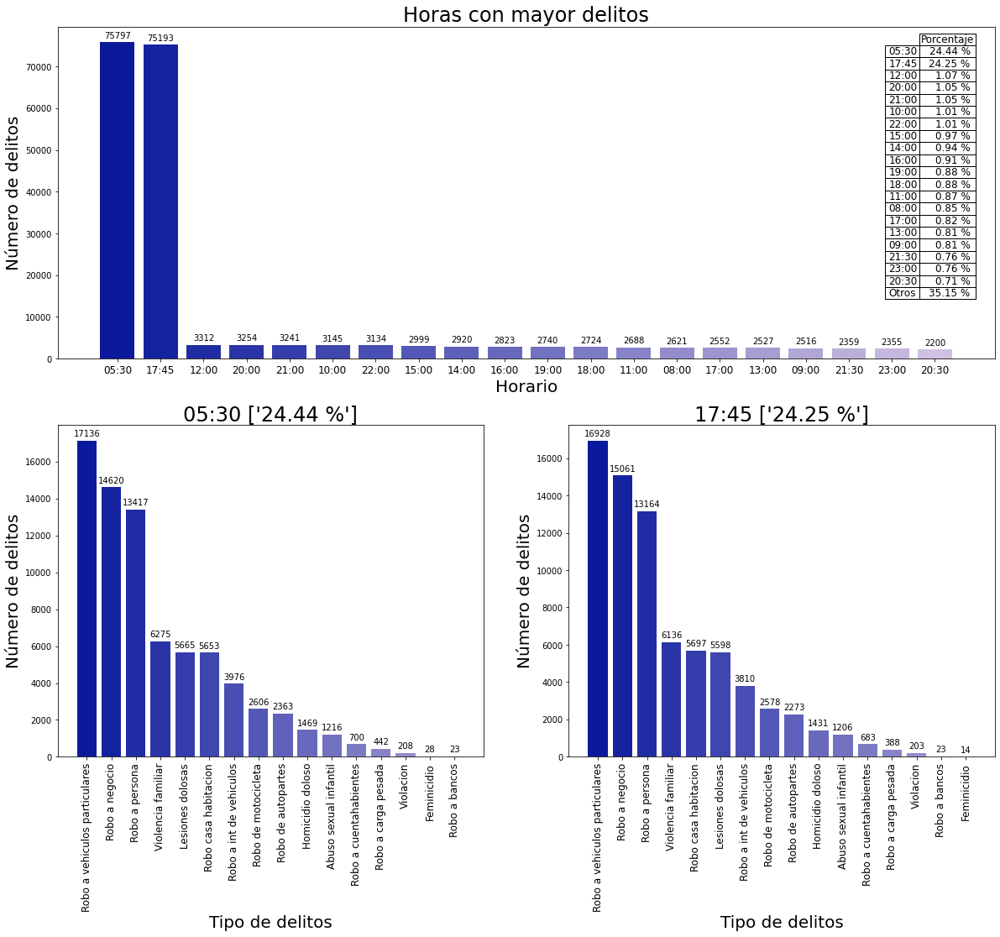

In [322]:
ser_aux = df_amg[df_amg['hora'] != 'N.D.']
ser_aux = ser_aux.groupby('hora').size()
ser_aux.sort_values(ascending=False, inplace=True)
n = 20 #número de horarios

ser_aux = ser_aux.iloc[:n]
s = pd.Series({'Otros': df_amg.shape[0] - ser_aux.sum()})
ser_aux = pd.concat([ser_aux, s])

color1 = (11, 26, 156)
color2 = (218, 201, 229)
bar_colors = get_color_gradient_rgb(color1, color2, n+1)

fig, ax = plt.subplots(sharex = False, sharey = False)
fig.set_size_inches(20, 16)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

ax = fig.add_subplot(2, 1, 1)
bar_container = ax.bar(ser_aux.index[:n], ser_aux[:n], color = bar_colors)
ax.set_title('Horas con mayor delitos', fontsize = 24)
ax.set_xlabel('Horario', fontsize = 20)
ax.tick_params(axis='x', labelsize = 12)
ax.set_ylabel('Número de delitos', fontsize = 20)
ax.bar_label(bar_container, padding = 3) 

cell_val = []
for i in range(0, len(ser_aux)):
    cell_val.append([f'{ser_aux[i] / ser_aux.sum() * 100:1.2f} %'])

table = ax.table(cellText = cell_val, 
         colWidths = [0.05],
         colLabels = ['Porcentaje'],
         rowLabels = ser_aux.index, 
         #rowColours = bar_colors, 
         loc = 'upper right')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2,1.2)

for i in [0, 1]:
    df_aux = df_amg[df_amg['hora'] == ser_aux.index[i]]
    ax = fig.add_subplot(2, 2, i+3)
    ser_aux1 = df_aux.groupby("delito").size()
    ser_aux1.sort_values(ascending=False, inplace=True)
    bar_container = ax.bar(ser_aux1.index, ser_aux1, color = bar_colors)
    ax.set_title(ser_aux.index[i] + ' ' + str(cell_val[i]), fontsize = 24)
    ax.set_xlabel('Tipo de delitos', fontsize = 20)
    ax.tick_params(axis ='x', labelsize = 12, rotation = 90)
    ax.set_ylabel('Número de delitos', fontsize = 20)
    ax.bar_label(bar_container, padding = 3) 

#fig.tight_layout()
plt.show()

###**4.2 Extracción de datos de los POIs.** 

Vamos a definir el valor de la variable ***sitio*** que puede ser un lugar o una dirección. Como ejemplo la definiremos como 'Hospicio Cabañas' por ser un lugar de gran afluencia en el Centro Histórico de Guadalajara. En la actualidad es el Museo Cabañas y fue declarado Patrimonio de la Humanidad por la UNESCO en 1997. En la Capilla Mayor se encuentran 57 frescos del artista jaliscience  José Clemente Orozco.

In [323]:
# Extraer coordenadas de sitio.

sitio = 'Hospicio Cabañas'

geolocator = Nominatim(user_agent = "foursquare_agent")
location = geolocator.geocode(sitio)
latitude = location.latitude
longitude = location.longitude

#Imprimos las coordenadas de sitio.
print(latitude, longitude)

20.676870649999998 -103.33770509037903


Definimos el radio de visualización en 1,000 metros. Esta distancia aplica tanto para el trazado de POIs como de delitos. Posteriormente convertimos la distancia de metros a coordenadas decimales con la siguiente fórmula. Básicamente se divide la circunferencia de la tierra en el ecuador entre 360 grados y se divide la distancia entre esa cantidad para conocer la parte proporcional de grado decimal que corresponde a esa distancia. La distancia que se calcula de esta manera es consistente con la distancia de los POIs proporcionada por la API de Foursquare.

In [324]:
distancia_metros = 1000 #en metros
metros_x_grado = 40075016.7 / 360  #40075161.2
grados_dec = distancia_metros / metros_x_grado
grados_dec

0.00898315283796251

En las siguientes celdas procedemos a extraer los datos de los POIs desde la API de Foursquare. La extracción está limitada a 50 POIs para cuentas Free. Posteriormente crearemos un dataframe *df_filtrado* que contiene los datos que nos interesan para su geolocalización y trazado en mapa. También agregaremos una columna con valores numéricos de la columna *categories* para crear las capas en el mapa nuevamente utilizando con la función *LabelEncoder()*.

In [325]:
url = "https://api.foursquare.com/v3/places/search"
search_query = ''
radius = distancia_metros
lim = 50 #limit no debe ser mayor a 50
lon_lat = str(latitude) + ',' + str(longitude) 

params = {
  	#"query": search_query,
  	"ll": lon_lat,
    "radius" : radius,
    "limit" : lim,
    "sort": "POPULARITY"  #"DISTANCE"
}

headers = {
    "Accept": "application/json",
    "Authorization": API_KEY
}

response = requests.request("GET", url, params=params, headers=headers)
venues = response.json()
df_foursquare = pd.json_normalize(venues['results'])
df_foursquare.head()

,fsq_id,categories,chains,distance,link,name,timezone,geocodes.main.latitude,geocodes.main.longitude,geocodes.roof.latitude,...,location.cross_street,location.formatted_address,location.locality,location.postcode,location.region,related_places.children,related_places.parent.fsq_id,related_places.parent.name,geocodes.drop_off.latitude,geocodes.drop_off.longitude
0,4d1512706c8b5481290edccc,"[{'id': 17000, 'name': 'Retail', 'icon': {'pre...",[],278,/v3/places/4d1512706c8b5481290edccc,Mercado San Juan de Dios,America/Mexico_City,20.675362,-103.339938,20.675362,...,Calz. Independencia Nte.,"Javier Mina 52 (Calz. Independencia Nte.), 442...",Guadalajara,44215,Jalisco,"[{'fsq_id': '5b831df0029a55002c7e5728', 'name'...",NaN,NaN,NaN,NaN
1,4d3755a71931224bdb0c14cb,"[{'id': 16041, 'name': 'Plaza', 'icon': {'pref...",[],959,/v3/places/4d3755a71931224bdb0c14cb,Plaza de Armas,America/Mexico_City,20.676224,-103.346979,20.676224,...,Liceo,"Avenida Morelos (Liceo), 44100 Guadalajara, Ja...",Guadalajara,44100,Jalisco,NaN,NaN,NaN,NaN,NaN
2,4bef3449ea570f4728128fd2,"[{'id': 16041, 'name': 'Plaza', 'icon': {'pref...",[],797,/v3/places/4bef3449ea570f4728128fd2,Plaza de la Liberación,America/Mexico_City,20.677061,-103.345664,NaN,...,Liceo,"Liceo, 44100 Guadalajara, Jalisco",Guadalajara,44100,Jalisco,[],NaN,NaN,NaN,NaN
3,4d3f2f85d625224bc2b5a9fa,"[{'id': 17045, 'name': 'Jewelry Store', 'icon'...",[],290,/v3/places/4d3f2f85d625224bc2b5a9fa,Magno Centro Joyero,America/Mexico_City,20.676447,-103.340348,20.676447,...,Calzada independencia,"Paseo del hospicio 22 (Calzada independencia),...",Guadalajara,44360,Jalisco,"[{'fsq_id': '59dd328d1c675b4aeefa455e', 'name'...",NaN,NaN,NaN,NaN
4,4d14dedf6d103704374e25bd,"[{'id': 17000, 'name': 'Retail', 'icon': {'pre...",[],381,/v3/places/4d14dedf6d103704374e25bd,Zona Comercial Obregón,America/Mexico_City,20.673410,-103.337088,NaN,...,entre Calz. Independencia y Belisario Domínguez,"Álvaro Obregón, Guadalajara, 44360 (entre Calz...",Guadalajara,44360,Jalisco,NaN,NaN,NaN,NaN,NaN


In [326]:
# mantener unicamente las columnas que incluyan el nombre del lugar y cualquier cosa asociada a la ubicación

col_seleccionadas = ['name', 'categories'] + [col for col in df_foursquare.columns if col.startswith('location.')] + [col for col in df_foursquare.columns if col.startswith('geocodes.main')]
df_filtrado = df_foursquare.loc[:, col_seleccionadas]

# función para extraer la categoría del lugar
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

# filtrar la categoría para cada fila
df_filtrado['categories'] = df_filtrado.apply(get_category_type, axis=1)

# limpiar la columna "names" manteniendo solo el último término
df_filtrado.columns = [column.split('.')[-1] for column in df_filtrado.columns]

encoder_foursquare = LabelEncoder()
df_filtrado['encoder'] = encoder_foursquare.fit_transform(df_filtrado['categories'])

df_filtrado.head()

,name,categories,address,country,cross_street,formatted_address,locality,postcode,region,latitude,longitude,encoder
0,Mercado San Juan de Dios,Retail,Javier Mina 52,MX,Calz. Independencia Nte.,"Javier Mina 52 (Calz. Independencia Nte.), 442...",Guadalajara,44215,Jalisco,20.675362,-103.339938,25
1,Plaza de Armas,Plaza,Avenida Morelos,MX,Liceo,"Avenida Morelos (Liceo), 44100 Guadalajara, Ja...",Guadalajara,44100,Jalisco,20.676224,-103.346979,23
2,Plaza de la Liberación,Plaza,NaN,MX,Liceo,"Liceo, 44100 Guadalajara, Jalisco",Guadalajara,44100,Jalisco,20.677061,-103.345664,23
3,Magno Centro Joyero,Jewelry Store,Paseo del hospicio 22,MX,Calzada independencia,"Paseo del hospicio 22 (Calzada independencia),...",Guadalajara,44360,Jalisco,20.676447,-103.340348,15
4,Zona Comercial Obregón,Retail,"Álvaro Obregón, Guadalajara, 44360",MX,entre Calz. Independencia y Belisario Domínguez,"Álvaro Obregón, Guadalajara, 44360 (entre Calz...",Guadalajara,44360,Jalisco,20.673410,-103.337088,25


Validamos los datos que nos interesan de *df_filtrado*, como *name*, *categories*, *latitude* y *longitude*. En este caso queda comprobado que no hay valores nulos en esas columnas. 

In [327]:
df_filtrado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               50 non-null     object 
 1   categories         50 non-null     object 
 2   address            43 non-null     object 
 3   country            50 non-null     object 
 4   cross_street       45 non-null     object 
 5   formatted_address  50 non-null     object 
 6   locality           49 non-null     object 
 7   postcode           35 non-null     object 
 8   region             50 non-null     object 
 9   latitude           50 non-null     float64
 10  longitude          50 non-null     float64
 11  encoder            50 non-null     int64  
dtypes: float64(2), int64(1), object(9)
memory usage: 4.8+ KB


Generamos una tabla con una vista rápida de *df_filtrado* para conocer nombre, categoría y dirección de los POIs extraidos de Foursquare. Después generamos una lista con las categorías presentes en *df_filtrado* necesaria para generar las capas en el mapa.

In [328]:
df_filtrado.loc[:, ['name', 'categories', 'address', 'encoder']]

,name,categories,address,encoder
0,Mercado San Juan de Dios,Retail,Javier Mina 52,25
1,Plaza de Armas,Plaza,Avenida Morelos,23
2,Plaza de la Liberación,Plaza,NaN,23
3,Magno Centro Joyero,Jewelry Store,Paseo del hospicio 22,15
4,Zona Comercial Obregón,Retail,"Álvaro Obregón, Guadalajara, 44360",25
5,Explanada del Hospicio Cabañas,Plaza,Plaza Tapatía,23
6,La Chata de Guadalajara,Mexican Restaurant,Avenida Corona 126,18
7,Instituto Cultural Cabañas,Landmarks and Outdoors,Cabañas 8,16
8,Teatro Degollado,Music Venue,Belén Lcdo. Morelos S / n,20
9,Huarachería Pelayo,Leather Goods Store,Mercado libertad local 510 y 512,17


In [329]:
for i, categoria in enumerate(df_filtrado['categories'].unique()):
    print(str(i) + ' ' + categoria)

0 Retail
1 Plaza
2 Jewelry Store
3 Mexican Restaurant
4 Landmarks and Outdoors
5 Music Venue
6 Leather Goods Store
7 Coffee Shop
8 Fast Food Restaurant
9 Café
10 Board Store
11 Bakery
12 Baby Store
13 Office Supply Store
14 Bar
15 Taco Restaurant
16 Telecommunication Service
17 Bank
18 Sculpture Garden
19 Ice Cream Parlor
20 Dive Bar
21 Arts and Entertainment
22 Restaurant
23 Drugstore
24 Pet Supplies Store
25 Video Games Store
26 Monument
27 Italian Restaurant
28 Snack Place
29 Computers and Electronics Retail
30 History Museum


###**4.3 Generación de mapas.** 

Ahora creamos un dataframe *df_map* que va a contener los registros que estén a una distancia menor o igual a 1,000 metros desde las coordenadas del sitio seleccionado. A este dataframe se le agrega una columna 'año' que se extrae de la variable datetime contenida en la columna 'fecha'. Este paso es necesario para generar las capas por año en el mapa.

In [330]:
df_map = pd.DataFrame()
df_map = (df_amg[np.sqrt((longitude - df_amg['x'])**2 + (latitude - df_amg['y'])**2) <= grados_dec]).copy(deep = True)
df_map["año"] = df_map['fecha'].dt.year
df_map.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4572 entries, 13254 to 323023
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   fecha          4572 non-null   datetime64[ns]
 1   delito         4572 non-null   object        
 2   x              4572 non-null   float64       
 3   y              4572 non-null   float64       
 4   colonia        4572 non-null   object        
 5   municipio      4572 non-null   object        
 6   clave_mun      4572 non-null   int64         
 7   hora           4560 non-null   object        
 8   bien_afectado  4572 non-null   object        
 9   encoder        4572 non-null   int64         
 10  año            4572 non-null   int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(5)
memory usage: 428.6+ KB


Creación del mapa de calor generado por los delitos alrededor del **sitio**. El mapa cuenta con capas para las diferentes categorías de Foursquare. De esta manera podemos visualizar sólo los establecimientos de nuestro interés además de que se incluyó tanto la categoría como el nombre del negocio en la etiqueta. El círculo amarillo representa al **sitio** mientras que los verdes a los POIs.

In [331]:
df =  df_map.loc[:, ['x', 'y']]

map_pois = folium.Map(location=[latitude, longitude], zoom_start = 15) # Generar mapa con centro en la dirección ingresada

pois = folium.FeatureGroup(name = sitio, overlay=True)
pois.add_to(map_pois)

grupos = []
for i, annio in enumerate(df_filtrado['categories'].unique()):
    grupos.append(folium.FeatureGroup(name = str(annio), overlay=True))
    grupos[i].add_to(map_pois)

# Añadir un circulo amarillo que represente la dirección
folium.CircleMarker(
    [latitude, longitude], radius = 16, color = 'orange', popup = sitio, fill = True, 
    fill_color = 'yellow', fill_opacity = 0.6).add_to(pois)

# Añadir los POI como circulos verdes
for lat, lng, enc, label, name in zip(df_filtrado.latitude, df_filtrado.longitude, df_filtrado.encoder, df_filtrado.categories.astype(str), df_filtrado.name.astype(str)):
    folium.CircleMarker([lat, lng], radius = 10, color = 'green', popup = (label + '\n' + name),
        fill = True, fill_color = 'green', fill_opacity = 0.6).add_to(grupos[enc])

heatmap = HeatMap(list(zip(df["y"], df["x"])))
heatmap.add_to(map_pois)
minimap = MiniMap()
map_pois.add_child(minimap)
folium.LayerControl().add_to(map_pois)

# mostrar el mapa
map_pois

Creación de mapa que contiene capas para visualizar los delitos por año. Los delitos se identifican visualmente por su categoría por medio de cuatro colores:

| Bien afectado                      | Color       |
|------------------------------------|-------------|
| El patrimonio                      | $\color{navy}{\text{navy}}$      |
| La vida y la integridad corporal   | $\color{darkred}{\text{darkred}}$   |
| La familia                         | $\color{darkorange}{\text{darkorange}}$ | 
| La libertad y la seguridad sexual  | $\color{darkmagenta}{\text{darkmagenta}}$ |  

El tamaño de los círculos representa su cercanía temporal, es decir, los más pequeños son delitos de 2017 y los más grandes son de 2022. También se incluyó en la etiqueta de la coordenada el tipo de delito, la fecha y hora en que sucedió. 

In [332]:
map_pois = folium.Map(location=[latitude, longitude], zoom_start = 15) # Generar mapa con centro en la dirección ingresada

pois = folium.FeatureGroup(name = 'POIs', overlay=True)
pois.add_to(map_pois)

grupos = []
for i, annio in enumerate(df_map['año'].unique()):
    grupos.append(folium.FeatureGroup(name = str(annio), overlay=True))
    grupos[i].add_to(map_pois)

# Añadir un circulo amarillo que represente la dirección
folium.CircleMarker(
    [latitude, longitude], radius = 16, color = 'orange', popup = sitio, fill = True, 
    fill_color = 'yellow', fill_opacity = 0.6).add_to(pois)

# Añadir los POI como circulos verdes
for lat, lng, label, name in zip(df_filtrado.latitude, df_filtrado.longitude, df_filtrado.categories.astype(str), df_filtrado.name.astype(str)):
    folium.CircleMarker([lat, lng], radius = 10, color = 'green', popup = (label + '\n' + name),
        fill = True, fill_color = 'green', fill_opacity = 0.6).add_to(pois)

colores_delito = ['darkmagenta', 'darkred', 'darkred', 'darkred', 'navy', 'navy', 'navy', 'navy', 
                  'navy', 'navy', 'navy', 'navy', 'navy', 'navy', 'darkmagenta', 'darkorange']

#colores_delito = ['sienna', 'indianred', 'indianred', 'indianred', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 
#                'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'sienna', 'springgreen']

df_map['dato'] = df_map.delito + ', ' + df_map.fecha.astype(str) + ', ' + df_map.hora
df_map.drop(['delito', 'fecha', 'hora'], axis=1)

for lat, lng, enc, label, annio in zip(df_map.y, df_map.x, df_map['encoder'], df_map['dato'], df_map['año']):
    folium.CircleMarker([lat, lng], radius = annio - 2012, color = colores_delito[enc], popup = label, 
    fill = True, fill_color = colores_delito[enc], fill_opacity = 0.4).add_to(grupos[annio - 2017])

folium.LayerControl().add_to(map_pois)

# mostrar el mapa
map_pois

En el siguiente mapa las capas se generan por tipo de delito. Los colores y tamaños tienen los mismos criterios que en el mapa anterior.

In [333]:
map_pois = folium.Map(location=[latitude, longitude], zoom_start = 15) # Generar mapa con centro en la dirección ingresada

pois = folium.FeatureGroup(name = 'POIs', overlay = True)
pois.add_to(map_pois)

grupos = []
for i, delito in enumerate(encoder_amg.classes_):
    grupos.append(folium.FeatureGroup(name = delito, overlay = True))
    grupos[i].add_to(map_pois)

# Añadir un circulo amarillo que represente la dirección
folium.CircleMarker(
    [latitude, longitude], radius = 16, color = 'orange', popup = sitio, fill = True,
    fill_color = 'yellow', fill_opacity = 0.6).add_to(pois)

# Añadir los POI como circulos verdes
for lat, lng, label, name in zip(df_filtrado.latitude, df_filtrado.longitude, df_filtrado.categories.astype(str), df_filtrado.name.astype(str)):
    folium.CircleMarker([lat, lng], radius = 10, color = 'green', popup = (label + '\n' + name),
        fill = True, fill_color = 'green', fill_opacity = 0.6).add_to(pois)

colores_delito = ['darkmagenta', 'darkred', 'darkred', 'darkred', 'navy', 'navy', 'navy', 'navy', 
                  'navy', 'navy', 'navy', 'navy', 'navy', 'navy', 'darkmagenta', 'darkorange']

#colores_delito = ['sienna', 'indianred', 'indianred', 'indianred', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 
#                'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'sienna', 'springgreen']

df_map['dato'] = df_map.delito + ', ' + df_map.fecha.astype(str) + ', ' + df_map.hora
df_map.drop(['delito', 'fecha', 'hora'], axis=1)

for lat, lng, enc, label, annio in zip(df_map.y, df_map.x, df_map['encoder'], df_map['dato'], df_map['año']):
    folium.CircleMarker([lat, lng], radius = annio - 2012, color = colores_delito[enc], popup = label, 
    fill = True, fill_color = colores_delito[enc], fill_opacity = 0.4).add_to(grupos[enc])


folium.LayerControl().add_to(map_pois)

# mostrar el mapa
map_pois

El siguiente diagrama de barras muestra el acumulado de los delitos en la zona mostrada en los mapas anteriores. En este caso son los delitos a 1,000 metros a la redonda del **sitio** entre los años 2017 a 2022. La segunda gráfica es un diagrama de barras que muestra un desglosado de cada delito cometido en esos años dentro del radio de 1,000 metros.

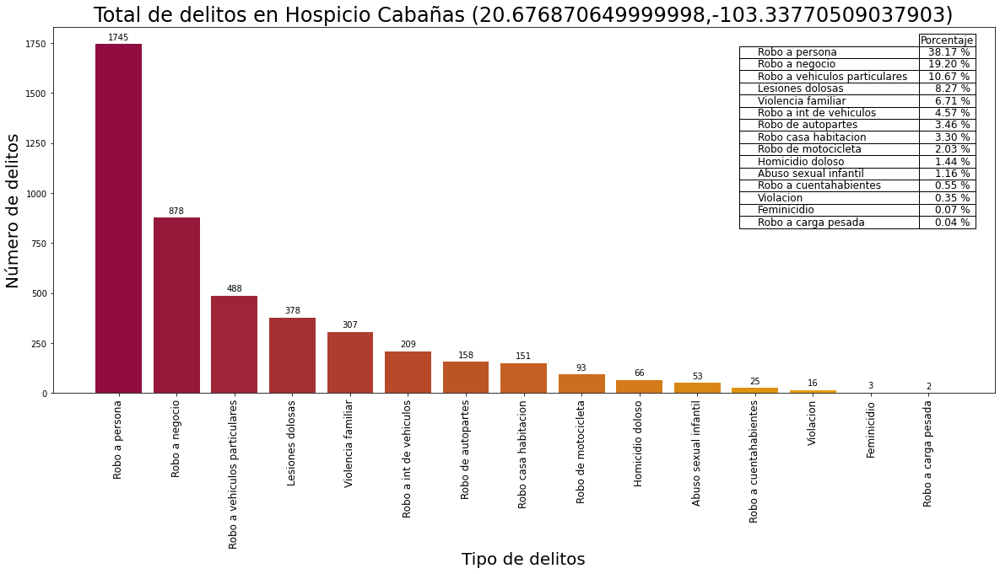

In [334]:
ser_aux = df_map.groupby("delito").size()
ser_aux.sort_values(ascending=False, inplace=True)

color1 = '#900C3F'
color2 = '#FFC300'
bar_colors = get_color_gradient(color1, color2, 16)

fig, ax = plt.subplots()
fig.set_size_inches(20, 8)
#ax.grid(visible=True, axis='y', alpha = 0.5)

bar_container = ax.bar(ser_aux.index, ser_aux, color = bar_colors)
ax.set_title('Total de delitos en ' + sitio + ' (' + lon_lat + ')', fontsize=24)
ax.set_xlabel('Tipo de delitos', fontsize = 20)
ax.tick_params(axis = 'x', labelsize = 12, rotation = 90)
ax.set_ylabel('Número de delitos', fontsize = 20)
ax.bar_label(bar_container, padding = 3) 

cell_val = []
for i in range(0, len(ser_aux)):
    cell_val.append([f'{ser_aux[i] / ser_aux.sum() * 100:1.2f} %'])

table = ax.table(cellText = cell_val, 
         colWidths = [0.05],
         colLabels = ['Porcentaje'],
         rowLabels = ser_aux.index, 
         #rowColours = bar_colors, 
         loc = 'upper right')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2,1.2)


plt.show()

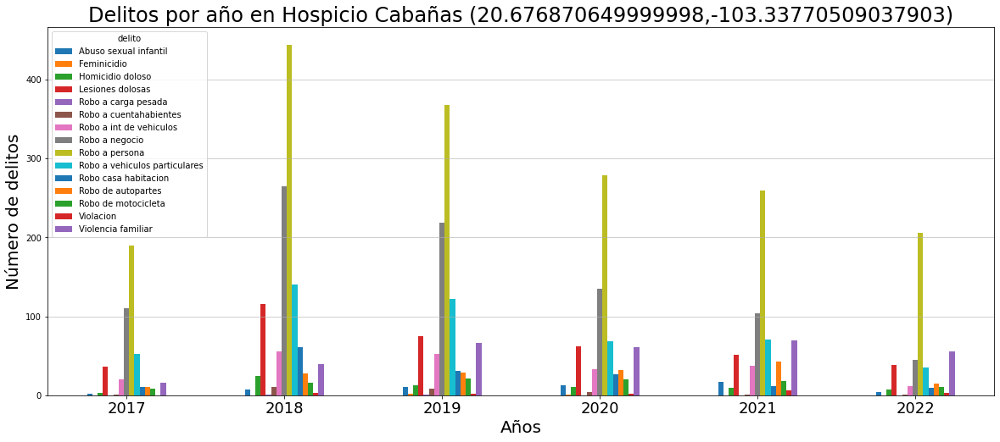

In [335]:
titulo_grafica = 'Delitos por año en ' + sitio + ' (' + lon_lat + ')'

df_aux = df_map.sort_values(by="fecha")
#df_map["año"] = df_map['fecha'].dt.year

df_aux = df_aux.groupby(['año', 'delito']).size().reset_index(name = 'total')

df_pivot = pd.pivot_table(
    df_aux,
    values = "total",
    index = "año",
    columns = "delito",
    aggfunc = np.sum
)

ax = df_pivot.plot(kind="bar")

fig = ax.get_figure()
fig.set_size_inches(20, 8)
ax.set_title(titulo_grafica, fontsize=24)
ax.set_xlabel('Años', fontsize=20)
ax.tick_params(axis='x', labelsize=18, rotation=0)
ax.set_ylabel('Número de delitos', fontsize=20)
ax.grid(visible=True, axis='y', alpha = 0.75)

plt.show()

##**5 Resultados.** <a name="resultados"></a>

Las gráficas mostraron que el municipio de Guadalajara es el de mayor incidencia delictiva acumulando el 41.62% del total del Área Metropolitana que casi duplica al municipio que le sigue en delitos acumulados, Zapopan con 21.98% y en tercer lugar San Pedro Tlaquepaque con 12.72%. Los delitos de mayor incidencia son Robo a vehículos particulares con 19.48% seguido por Robo a persona con 17.61%, Robo a negocio 17.02%, Violencia familiar 12.46% y en quinto lugar Lesiones dolosas con 8.50%.  

En el mapa de calor fue posible visualizar en un círculo amarillo nuestro sitio de interés y los 50 POIs más populares dentro de un radio de un kilómetro. Además, se visualiza con claridad la densidad de delitos en la zona. En los mapas por capas fue posible filtrar por año o tipo de delito para visualizar sólo los datos que nos interesan. Por ejemplo, alguien que planea establecer un negocio de refacciones automotrices le interesara los delitos relacionados con el robo a vehículos, autopartes y negocio pero no los delitos de violencia familiar. En cambio, una ONG o dependencia gubernamental que se disponga a atender a las víctimas de este delito le podría interesar encontrar una zona con incidencia alta de violencia familiar.

##**6 Discusión.** <a name="discusion"></a>

Las gráficas muestran desde 2018 una tendencia a baja en la incidencia delictiva, sin embargo, recordemos que faltan registros de enero a agosto de 2017 y de septiembre a diciembre de 2022. Es una cantidad importante de datos que sin duda afecta la percepción de la tendencia. Es necesario recordar que los registros sólo son de delitos que tienen una carpeta de investigación en la Fiscalía del Estado. Existen una cantidad difícil de determinar de delitos que no se denuncian y por lo tanto no tienen registro. Aunado a ello en este proyecto no se consideraron los delitos del fuero federal que son aquellos que afectan a la nación o todos los mexicanos como son los delitos electorales, contra la salud, la delincuencia organizada, delitos en materia de hidrocarburos, armas de fuego y explosivos entre otros (INEGI, 2022b).  

Aunque la información de la incidencia delictiva no es exhaustiva, por las razones arriba mencionadas, consideramos que nos muestra un panorama los suficientemente preciso para evaluar el riesgo de visitar un sitio, poner un negocio o vivir en la zona. Esta información también puede ser útil en el sector inmobiliario para determinar el posible impacto en la plusvalía de los bienes. Para las dependencias de seguridad pública, o empresas de seguridad privada, es de llamar la atención que el 48.69% de los delitos suceden en dos horarios, 5:30 y 17:45, dato a tomar en cuenta para las estrategias de seguridad.

##**7 Conclusión.** <a name="conclusion"></a>

El objetivo de este proyecto es mostrar los 50 POIs más populares en torno a un lugar junto con el mapeo de la incidencia delictiva en la zona. Esta información se proporciona para contribuir en la toma de decisiones sobre el impacto que pueden tener los establecimientos y la delincuencia sobre un proyecto de negocio, vivienda o simplemente una visita turística. También puede ser útil para la implementación de estrategias enfocadas a la prevención y combate del delito, a través de la rehabilitación de espacios educativos y recreativos, programas sociales, patrullaje, instalación de módulos policiacos, etc.



##**8 Referencias.** <a name="referencias"></a>

Gajić, A., 2022. 99 firms. [En línea] 
Disponible en: [https://99firms.com/blog/foursquare-statistics/#:~:text=Foursquare%20has%20over%2050%20million%20monthly%20active%20users.,platform%20boasts%20more%20than%2060%20million%20registered%20users](https://99firms.com/blog/foursquare-statistics/#:~:text=Foursquare%20has%20over%2050%20million%20monthly%20active%20users.,platform%20boasts%20more%20than%2060%20million%20registered%20users).
[Último acceso: 19 2 2023].

INEGI, 2022a. INEGI. [En línea] 
Disponible en: [https://www.inegi.org.mx/contenidos/saladeprensa/boletines/2022/PIBEF/PIBEF.pdf](https://www.inegi.org.mx/contenidos/saladeprensa/boletines/2022/PIBEF/PIBEF.pdf)
[Último acceso: 19 2 2023].  


INEGI, 2022b. INEGI. [En línea] Disponible en:
[https://iieg.gob.mx/ns/?page_id=25213](https://iieg.gob.mx/ns/?page_id=25213)
[Último acceso: 19 2 2023]. 